In [1]:
library(conos)
library(cowplot)
library(Seurat)
library(pagoda2)

library(dplyr)
library(ggplot2)

Loading required package: Matrix

Loading required package: igraph


Attaching package: ‘igraph’


The following objects are masked from ‘package:stats’:

    decompose, spectrum


The following object is masked from ‘package:base’:

    union



********************************************************

Note: As of version 1.0.0, cowplot does not change the

  default ggplot2 theme anymore. To recover the previous

  behavior, execute:
  theme_set(theme_cowplot())

********************************************************




# load Seurat object (our single cell adrenal medulla data)

In [ ]:
#load Seurat object (our single cell adrenal medulla data)

SR_embryo = readRDS('../data/seurat/adrenal.human.seurat.rds')

# load neuroblastoma data from Dong et al., GSE137804

In [20]:
#load metadata for Neuroblastoma datasets from Dong et al.
#ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE137nnn/GSE137804/matrix/GSE137804_series_matrix.txt.gz

m_sample_metadata = t(read.delim('../data/neuroblastoma_GSE137804/GSE137804_series_matrix.txt.gz', skip = 31, sep='\t'))
sample_metadata = data.frame(m_sample_metadata[2:nrow(m_sample_metadata),])
colnames(sample_metadata) = m_sample_metadata[1,]
sample_metadata
dim(m_sample_metadata[2:nrow(m_sample_metadata),])
length(m_sample_metadata[1,])

,!Sample_geo_accession,!Sample_status,!Sample_submission_date,!Sample_last_update_date,!Sample_type,!Sample_channel_count,!Sample_source_name_ch1,!Sample_organism_ch1,!Sample_characteristics_ch1,!Sample_characteristics_ch1.1,⋯,!Sample_library_source,!Sample_library_strategy,!Sample_relation,!Sample_relation.1,!Sample_supplementary_file_1,!Sample_supplementary_file_2,!Sample_supplementary_file_3,!series_matrix_table_begin,ID_REF,!series_matrix_table_end
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
T10,GSM4088774,Public on Sep 18 2020,Sep 20 2019,Sep 18 2020,SRA,1,neuroblastoma tissue,Homo sapiens,Sex: male,age: 3Y3M,⋯,transcriptomic,RNA-Seq,BioSample: https://www.ncbi.nlm.nih.gov/biosample/SAMN12799275,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX6881705,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM4088nnn/GSM4088774/suppl/GSM4088774_T10_gene_cell_exprs_table.xls.gz,,,,GSM4088774,
T19,GSM4088775,Public on Sep 18 2020,Sep 20 2019,Sep 18 2020,SRA,1,neuroblastoma tissue,Homo sapiens,Sex: female,age: 2Y2M,⋯,transcriptomic,RNA-Seq,BioSample: https://www.ncbi.nlm.nih.gov/biosample/SAMN12799274,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX6881706,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM4088nnn/GSM4088775/suppl/GSM4088775_T19_gene_cell_exprs_table.xls.gz,,,,GSM4088775,
T27,GSM4088776,Public on Sep 18 2020,Sep 20 2019,Sep 18 2020,SRA,1,neuroblastoma tissue,Homo sapiens,Sex: male,age: 3Y4M,⋯,transcriptomic,RNA-Seq,BioSample: https://www.ncbi.nlm.nih.gov/biosample/SAMN12799273,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX6881707,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM4088nnn/GSM4088776/suppl/GSM4088776_T27_gene_cell_exprs_table.xls.gz,,,,GSM4088776,
T34,GSM4088777,Public on Sep 18 2020,Sep 20 2019,Sep 18 2020,SRA,1,neuroblastoma tissue,Homo sapiens,Sex: female,age: 3Y2M,⋯,transcriptomic,RNA-Seq,BioSample: https://www.ncbi.nlm.nih.gov/biosample/SAMN12799272,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX6881708,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM4088nnn/GSM4088777/suppl/GSM4088777_T34_gene_cell_exprs_table.xls.gz,,,,GSM4088777,
T40,GSM4088778,Public on Sep 18 2020,Sep 20 2019,Sep 18 2020,SRA,1,neuroblastoma tissue,Homo sapiens,Sex: male,age: 2M26D,⋯,transcriptomic,RNA-Seq,BioSample: https://www.ncbi.nlm.nih.gov/biosample/SAMN12799270,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX6881709,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM4088nnn/GSM4088778/suppl/GSM4088778_T40_gene_cell_exprs_table.xls.gz,,,,GSM4088778,
T44,GSM4088779,Public on Sep 18 2020,Sep 20 2019,Sep 18 2020,SRA,1,neuroblastoma tissue,Homo sapiens,Sex: female,age: 2M6D,⋯,transcriptomic,RNA-Seq,BioSample: https://www.ncbi.nlm.nih.gov/biosample/SAMN12799269,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX6881710,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM4088nnn/GSM4088779/suppl/GSM4088779_T44_gene_cell_exprs_table.xls.gz,,,,GSM4088779,
T69,GSM4088780,Public on Sep 18 2020,Sep 20 2019,Sep 18 2020,SRA,1,neuroblastoma tissue,Homo sapiens,Sex: male,age: 2Y5M,⋯,transcriptomic,RNA-Seq,BioSample: https://www.ncbi.nlm.nih.gov/biosample/SAMN12799268,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX6881711,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM4088nnn/GSM4088780/suppl/GSM4088780_T69_gene_cell_exprs_table.xls.gz,,,,GSM4088780,
T71,GSM4088781,Public on Sep 18 2020,Sep 20 2019,Sep 18 2020,SRA,1,neuroblastoma tissue,Homo sapiens,Sex: male,age: 5D,⋯,transcriptomic,RNA-Seq,BioSample: https://www.ncbi.nlm.nih.gov/biosample/SAMN12799266,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX6881712,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/GSM4088nnn/GSM4088781/suppl/GSM4088781_T71_gene_cell_exprs_table.xls.gz,,,,GSM4088781,
T75,GSM4088782,Public on Sep 18 2020,Sep 20 2019,Sep 18 2020,SRA,1,neuroblastoma tissue,Homo sapiens,Sex: male,age: 9M10D,⋯,transcriptomic,RNA-Seq,BioSample: https://www.ncbi.nlm.nih.gov/biosample/SAMN12799264,SRA: https://www.ncbi.nlm.nih.gov/sra?term=SRX6881713,ftp://ftp.ncbi.nlm.nih.gov/geo/samples/

[1] 22 40

[1] 40

In [37]:
#load neuroblastoma data from Dong et al., GSE137804
#You will need to download and un-tar this file GSE137804_RAW.tar to ../data/neuroblastoma_GSE137804/
#https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSE137804&format=file

l_raw_counts = list()

sample_metadata_sel = sample_metadata[sample_metadata['!Sample_source_name_ch1']=='neuroblastoma tissue', ]
for(i in 1:nrow(sample_metadata_sel)){
    fname = paste0('../data/neuroblastoma_GSE137804/', sample_metadata_sel[i, '!Sample_geo_accession'], '_', rownames(sample_metadata_sel)[i], '_')
    print(paste(sample_metadata_sel[i, '!Sample_geo_accession'], '->', fname))
    
    fpath = paste0('../data/neuroblastoma_GSE137804/', sample_metadata_sel[i, '!Sample_geo_accession'])
    print(fpath)
    dir.create(fpath)
    
    if(!file.exists(paste0(fname, 'barcodes.tsv.gz'))){
        print('...missing')
        next
    }else{
        print('...OK')
    }
    
    system(paste('ln -s ', paste0(fname, 'barcodes.tsv.gz'), paste0(fpath, '/barcodes.tsv.gz')))
    system(paste('ln -s ', paste0(fname, 'features.tsv.gz'), paste0(fpath, '/features.tsv.gz')))
    system(paste('ln -s ', paste0(fname, 'matrix.mtx.gz'), paste0(fpath, '/matrix.mtx.gz')))
    
    
    data <- Read10X(fpath)
    SR <- CreateSeuratObject(counts = data, project = rownames(sample_metadata_sel)[i], min.cells = 3, min.features = 200)
    SR
    
    l_raw_counts[ rownames(sample_metadata_sel)[i] ] = SR@assays$RNA@counts
    
    rm(data, SR)
    gc()
    
}


[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088774_T10_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088774"


Warning message in dir.create(fpath):
“'/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088774' already exists”


[1] "...missing"
[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088775_T19_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088775"


Warning message in dir.create(fpath):
“'/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088775' already exists”


[1] "...missing"
[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088776_T27_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088776"


Warning message in dir.create(fpath):
“'/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088776' already exists”


[1] "...missing"
[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088777_T34_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088777"


Warning message in dir.create(fpath):
“'/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088777' already exists”


[1] "...missing"
[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088778_T40_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088778"


Warning message in dir.create(fpath):
“'/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088778' already exists”


[1] "...missing"
[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088779_T44_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088779"


Warning message in dir.create(fpath):
“'/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088779' already exists”


[1] "...missing"
[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088780_T69_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088780"


Warning message in dir.create(fpath):
“'/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088780' already exists”


[1] "...missing"
[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088781_T71_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088781"


Warning message in dir.create(fpath):
“'/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088781' already exists”


[1] "...missing"
[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088782_T75_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088782"


Warning message in dir.create(fpath):
“'/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088782' already exists”


[1] "...missing"
[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088783_T92_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088783"


Warning message in dir.create(fpath):
“'/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4088783' already exists”


[1] "...missing"
[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4654669_T162_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4654669"


Warning message in dir.create(fpath):
“'/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4654669' already exists”
Warning message in `[<-`(`*tmp*`, rownames(sample_metadata_sel)[i], value = SR@assays$RNA@counts):
“implicit list embedding of S4 objects is deprecated”


[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4654670_T175_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4654670"


Warning message in `[<-`(`*tmp*`, rownames(sample_metadata_sel)[i], value = SR@assays$RNA@counts):
“implicit list embedding of S4 objects is deprecated”


[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4654671_T188_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4654671"


Warning message in `[<-`(`*tmp*`, rownames(sample_metadata_sel)[i], value = SR@assays$RNA@counts):
“implicit list embedding of S4 objects is deprecated”


[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4654672_T200_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4654672"


Warning message in `[<-`(`*tmp*`, rownames(sample_metadata_sel)[i], value = SR@assays$RNA@counts):
“implicit list embedding of S4 objects is deprecated”


[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4654673_T214_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4654673"


Warning message in `[<-`(`*tmp*`, rownames(sample_metadata_sel)[i], value = SR@assays$RNA@counts):
“implicit list embedding of S4 objects is deprecated”


[1] "1 -> /mnt/data/artem/data/neuroblastoma_GSE137804/GSM4654674_T230_"
[1] "/mnt/data/artem/data/neuroblastoma_GSE137804/GSM4654674"


Warning message in `[<-`(`*tmp*`, rownames(sample_metadata_sel)[i], value = SR@assays$RNA@counts):
“implicit list embedding of S4 objects is deprecated”


In [39]:
names(l_raw_counts)

[1] "T162" "T175" "T188" "T200" "T214" "T230"

In [28]:
sample_metadata_sel[1, '!Sample_geo_accession']

[1] "GSM4088774"

# Merge datasets with conos

In [ ]:
#create a list of count matrices for conos
#perform preprocessing for each sample with Seurat

pp = lapply(l_raw_counts, basicSeuratProc, umap=T)

SR_embryo = readRDS('../data/seurat/adrenal.human.seurat.rds')
SR_embryo = RunTSNE(SR_embryo)

#add single cell embryonic data to sample list
pp$embryo = SR_embryo[,SR_embryo@meta.data$timepoint<10]


In [ ]:
#Merge datasets with conos

con <- Conos$new(pp, n.cores=1)
con$buildGraph(k=30, k.self=5, space='PCA', ncomps=30, n.odgenes=2000, matching.method='mNN', metric='angular', score.component.variance=TRUE, verbose=TRUE)
con$findCommunities(method=leiden.community, min.group.size=0)

In [ ]:
con$embedGraph(method="UMAP", min.dist=0.01, spread=15, n.cores=1, min.prob.lower=1e-3)

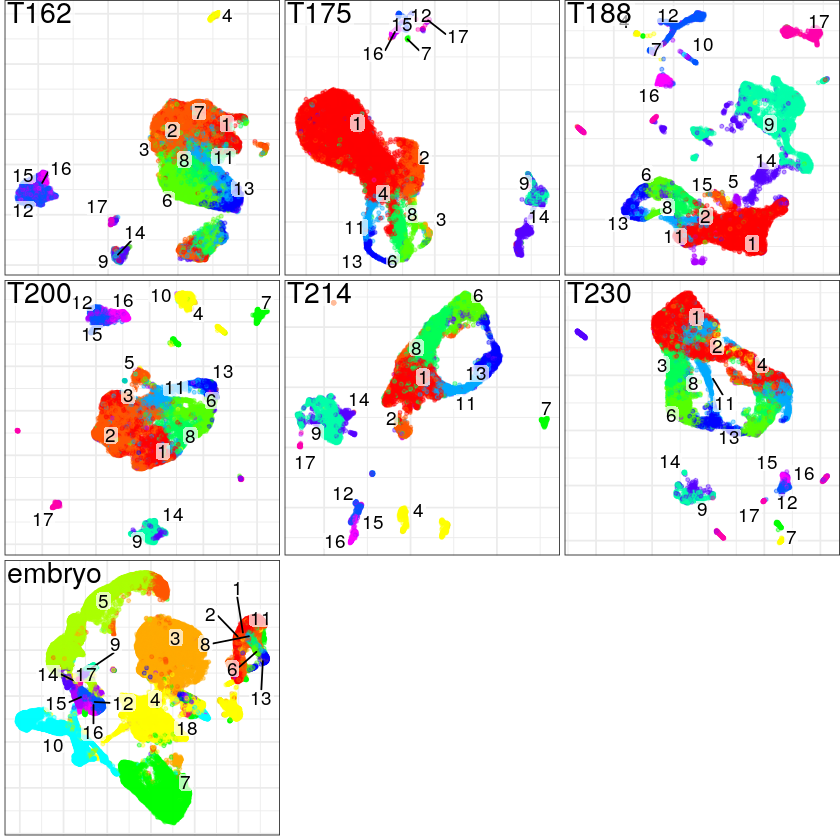

In [5]:
con$plotPanel(font.size=4, embedding.type='umap')

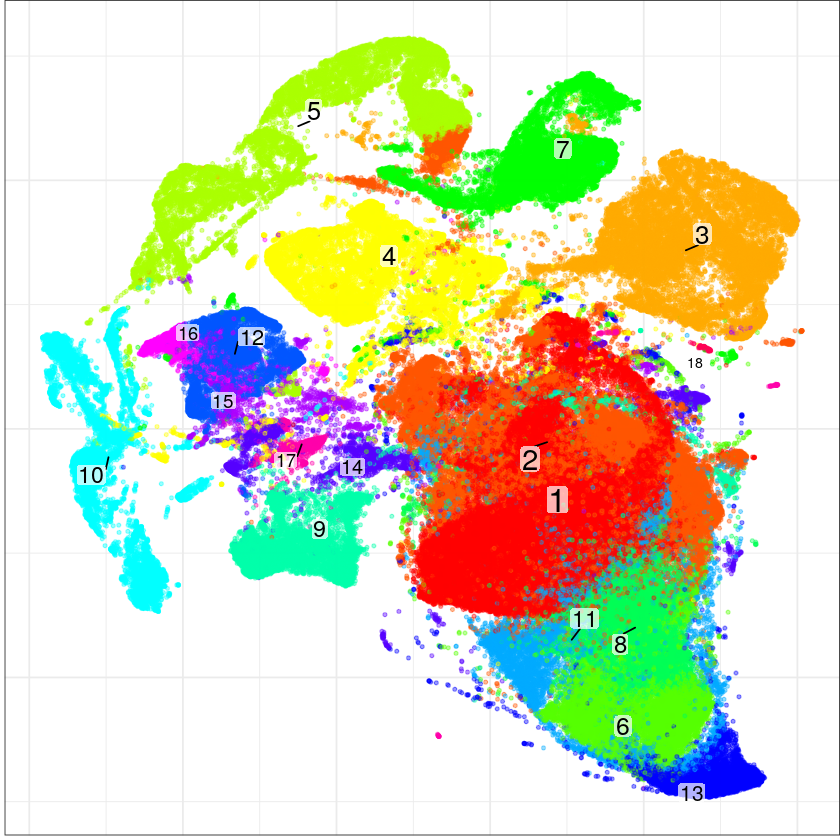

In [3]:
con$plotGraph()

## Propagate labels from single cell human adrenal data (our) to Neuroblastoma datasets from Dong et al.

R30_w8.5_AAACCCAAGAGATGCC-1 R30_w8.5_AAACCCAAGATTGTGA-1 
                   "cortex"                    "kidney" 
R30_w8.5_AAACCCAAGGATACGC-1 R30_w8.5_AAACCCACAAAGGCTG-1 
               "mesenchyme"               "endothelium" 
R30_w8.5_AAACCCACACGCTGTG-1 R30_w8.5_AAACCCACAGAGGCAT-1 
                   "cortex"                    "cortex"

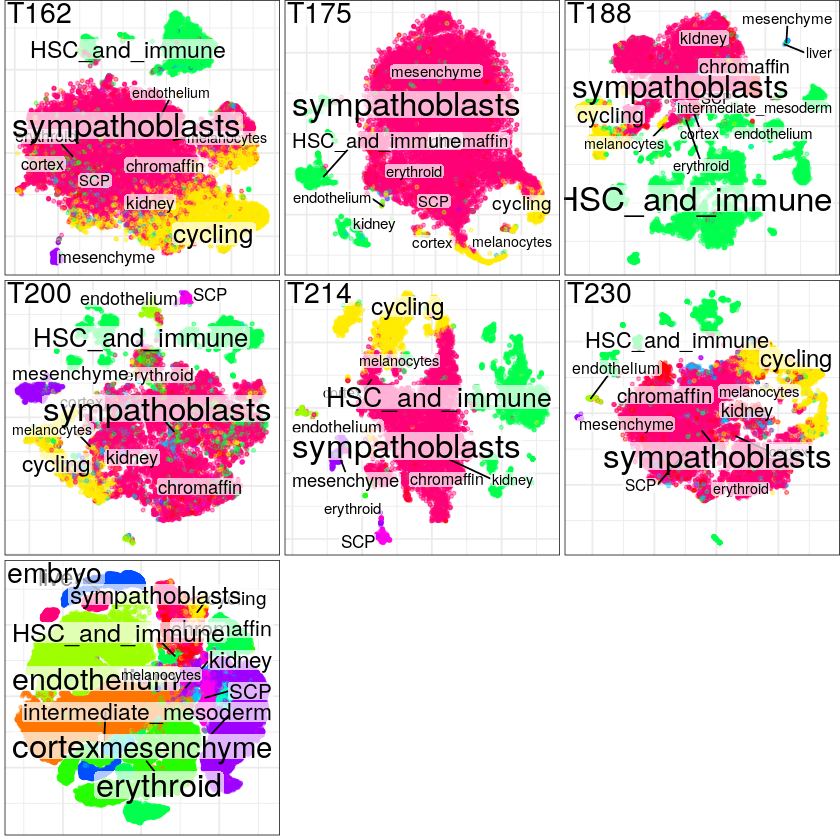

In [5]:
# Propagate labels from single cell human adrenal data (our) to neuroblastoma datasets from Dong et al.

fates_medulla = SR_embryo@meta.data$fate
names(fates_medulla) = rownames(SR_embryo@meta.data)
head(fates_medulla)

head(fates_medulla)


new.label.probabilities <- con$propagateLabels(labels = fates_medulla,verbose = T)
#new.annot <- setNames(colnames(new.label.probabilities)[apply(new.label.probabilities,1,which.max)], rownames(new.label.probabilities))
new.annot = new.label.probabilities$labels

con$plotPanel(groups = new.annot)
dir.create('figures/neuroblastoma_Dong/', showWarnings = F)
ggsave('figures/neuroblastoma_Dong/panel_projected_annot.pdf', width=10, height=10)

Warning message in if (class(embedding.type) == "matrix") {:
“the condition has length > 1 and only the first element will be used”


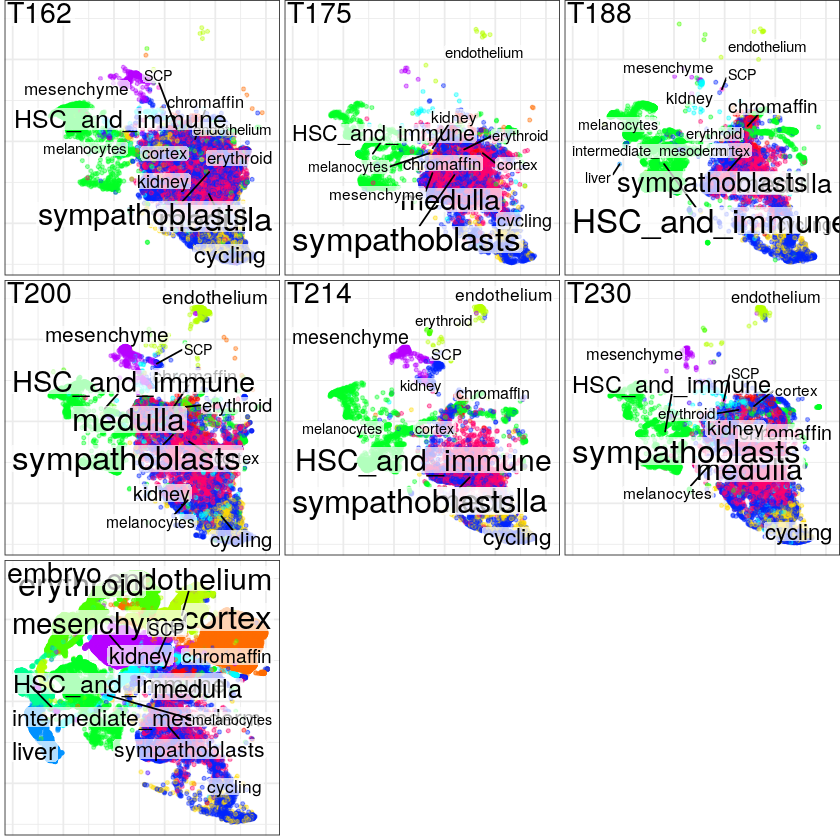

In [16]:
con$plotPanel(groups = new.annot, use.common.embedding=T)

## Summarize and visualize propagated cell types in individual Neuroblastoma datasets

In [8]:
l_new_annot = lapply(names(con$samples), function(x){
    cells = colnames(con$samples[[x]])
    df = data.frame(cells = cells, new.annot = new.annot[cells], sample = x)
})

df_new_annot = do.call(rbind, l_new_annot)
head(df_new_annot)

,cells,new.annot,sample
,<chr>,<chr>,<chr>
AAACCCAAGACCATTC-1,AAACCCAAGACCATTC-1,sympathoblasts,T162
AAACCCAAGATCCAAA-1,AAACCCAAGATCCAAA-1,sympathoblasts,T162
AAACCCAAGATGAAGG-1,AAACCCAAGATGAAGG-1,cycling,T162
AAACCCAAGCAAACAT-1,AAACCCAAGCAAACAT-1,sympathoblasts,T162
AAACCCAAGCACAAAT-1,AAACCCAAGCACAAAT-1,sympathoblasts,T162
AAACCCAAGCACTTTG-1,AAACCCAAGCACTTTG-1,cycling,T162


In [9]:
df_new_annot_count = df_new_annot %>% group_by(sample, new.annot) %>% summarize(n=n()) 
head(df_new_annot_count)

`summarise()` regrouping output by 'sample' (override with `.groups` argument)



sample,new.annot,n
<chr>,<chr>,<int>
embryo,chromaffin,1947
embryo,cortex,13523
embryo,cycling,886
embryo,endothelium,9844
embryo,erythroid,12582
embryo,HSC_and_immune,4424


In [8]:
df_new_annot %>% filter(sample!='embryo') %>% group_by(new.annot) %>% summarize(n=n()) %>% arrange(-n)

`summarise()` ungrouping output (override with `.groups` argument)



new.annot,n
<chr>,<int>
sympathoblasts,59211
HSC_and_immune,18490
cycling,14063
chromaffin,2561
kidney,1368
mesenchyme,1270
endothelium,568
erythroid,479
SCP,464


`summarise()` ungrouping output (override with `.groups` argument)

Saving 6.67 x 6.67 in image



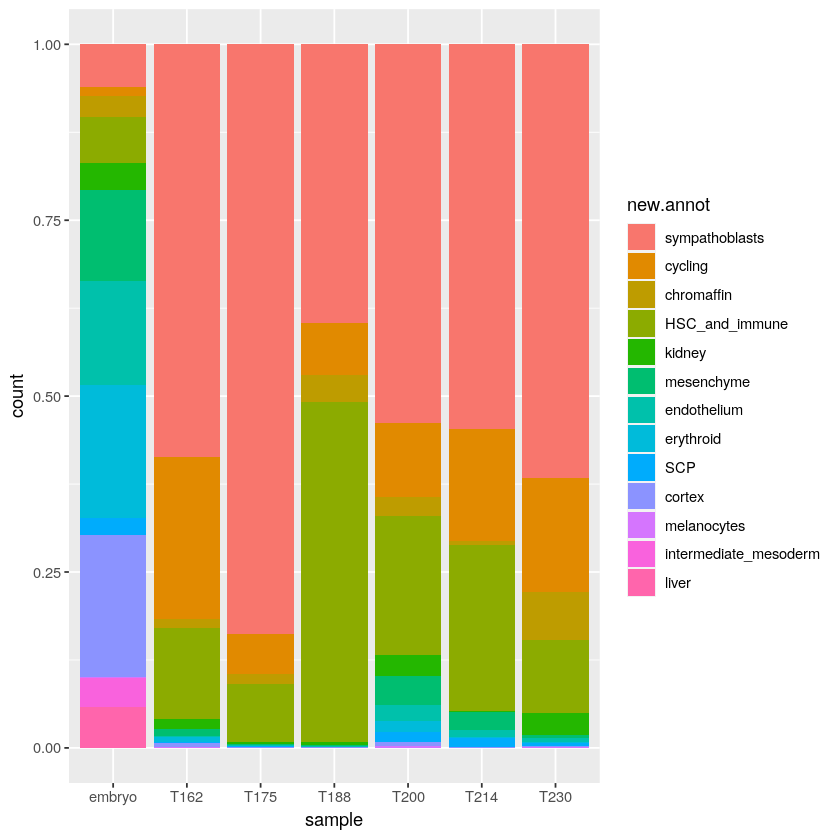

Saving 6.67 x 6.67 in image



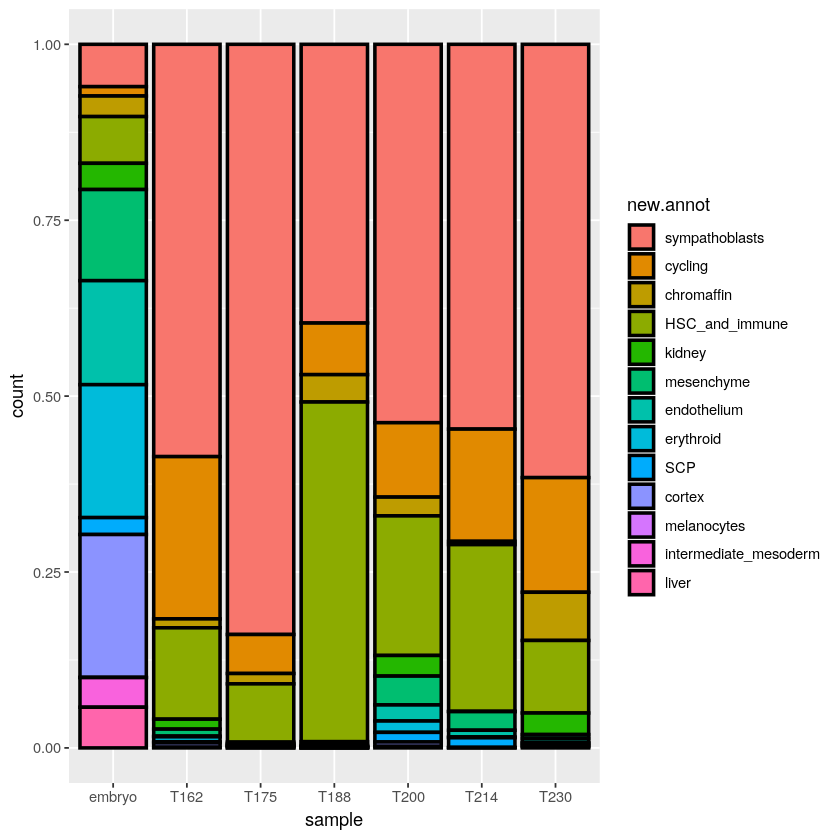

In [10]:
#summarize propagated cell labels

ord = (df_new_annot %>% filter(sample!='embryo') %>% group_by(new.annot) %>% summarize(n=n()) %>% arrange(-n))$new.annot
ord[1:4] = c('sympathoblasts', 'cycling', 'chromaffin', 'HSC_and_immune')
df_new_annot2 = df_new_annot
df_new_annot2$new.annot = factor(df_new_annot2$new.annot, levels = ord)
ggplot(df_new_annot2, aes(x=sample, fill=new.annot))+geom_bar(position="fill")
dir.create('figures/neuroblastoma_Dong/', showWarnings = F)
ggsave('figures/neuroblastoma_Dong/barplot_projected_annot.pdf')

ggplot(df_new_annot2, aes(x=sample, fill=new.annot))+geom_bar(position="fill", size=1, col='black')
ggsave('figures/neuroblastoma_Dong/barplot_projected_annot.border.pdf')

In [66]:
setdiff(fates, ord)

character(0)

# Export embeddings

Warning message in dir.create("figures/neuroblastoma_Dong/shared_graph_nogrid/"):
“'figures/neuroblastoma_Dong/shared_graph_nogrid' already exists”


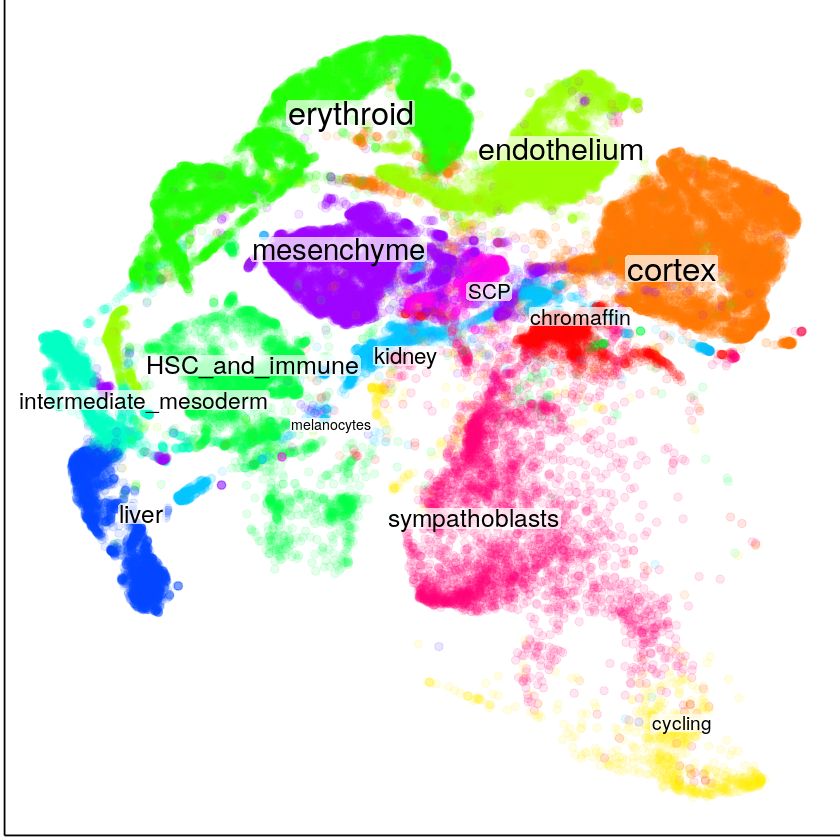

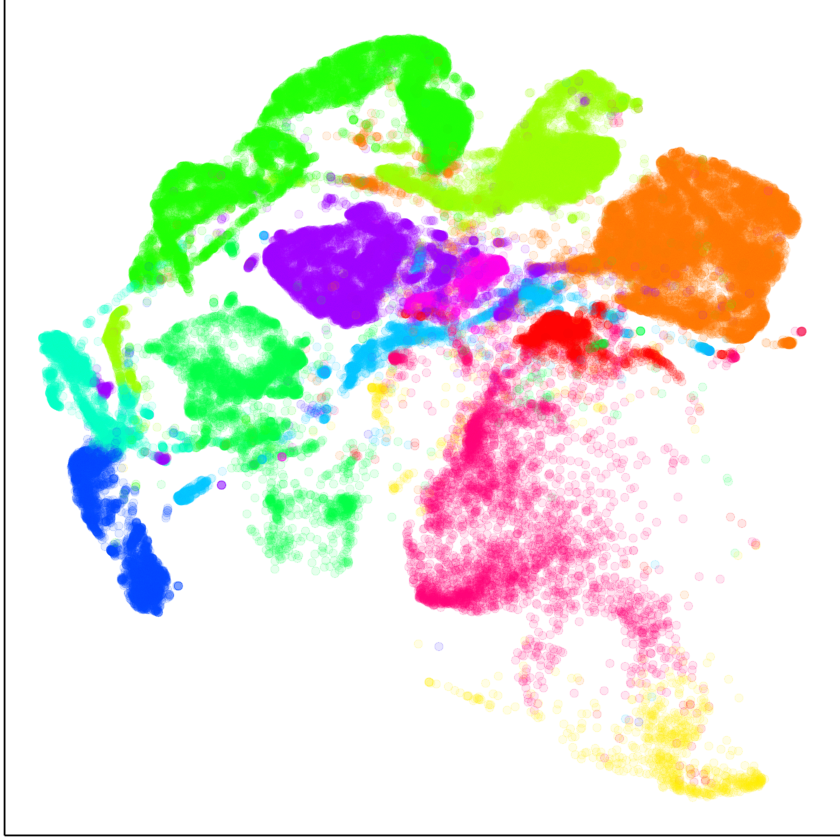

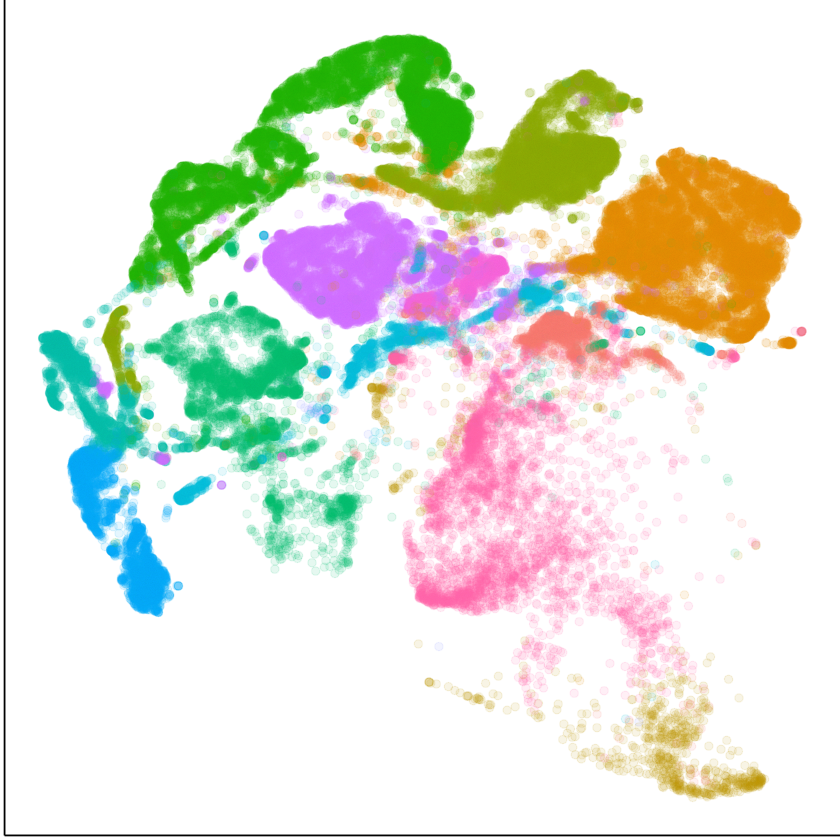

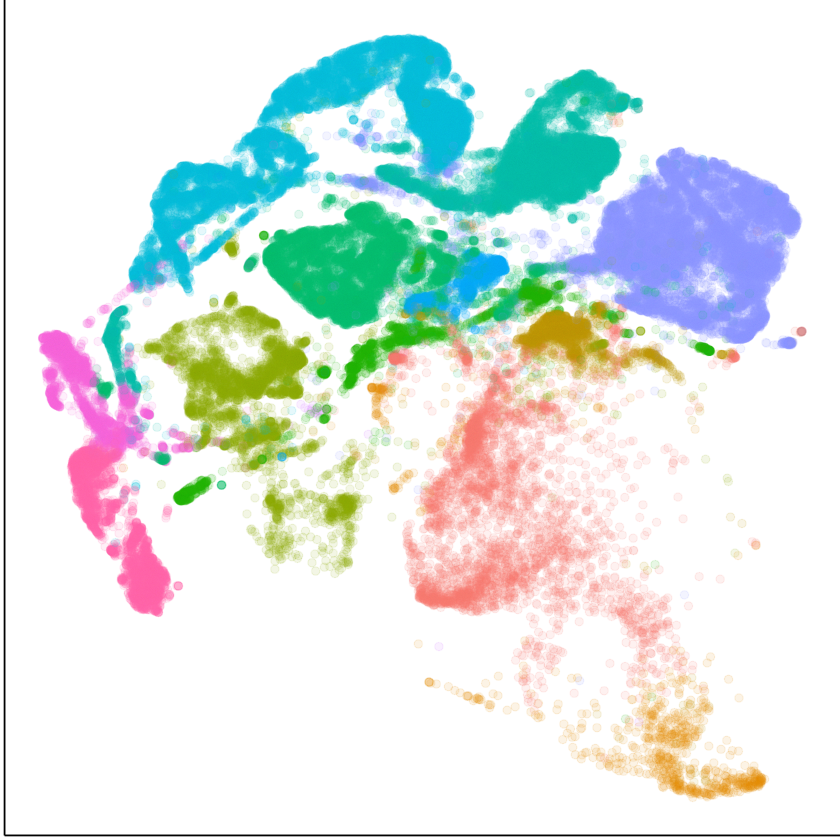

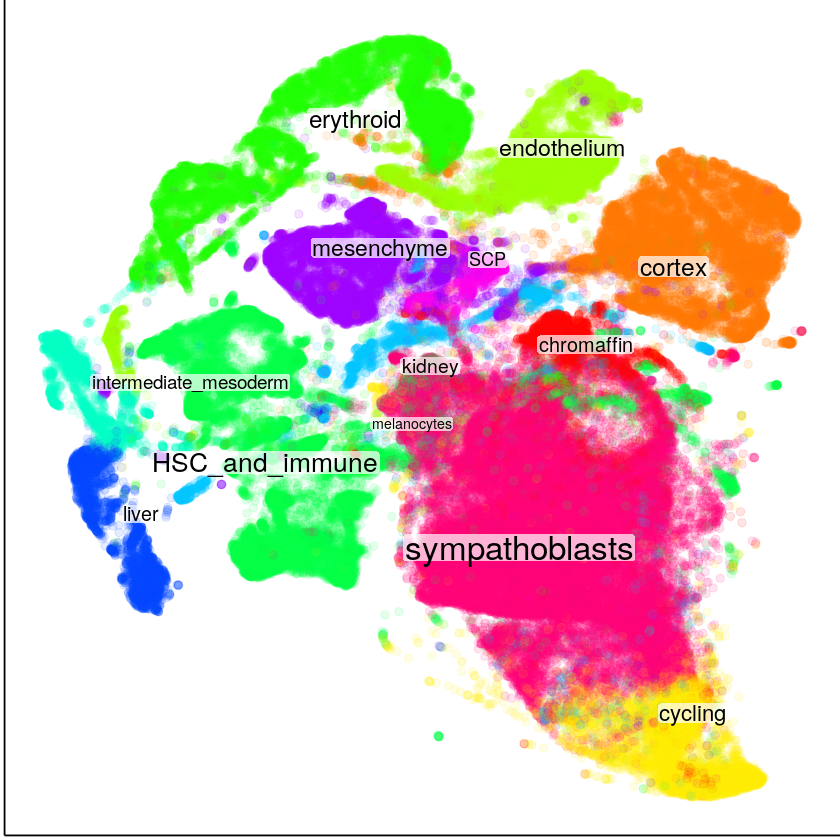

...

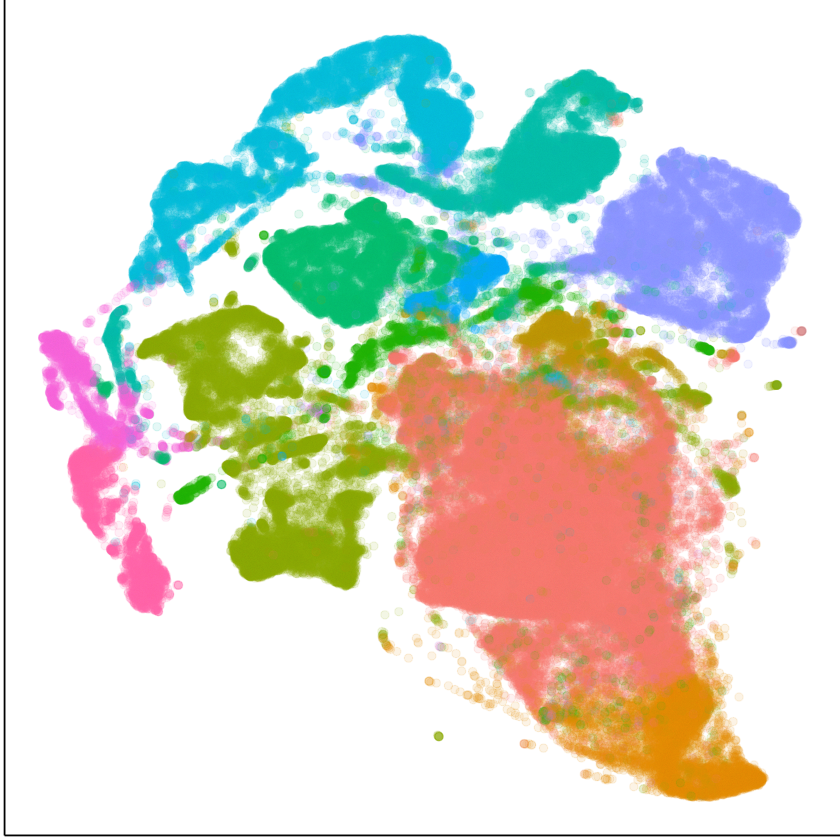

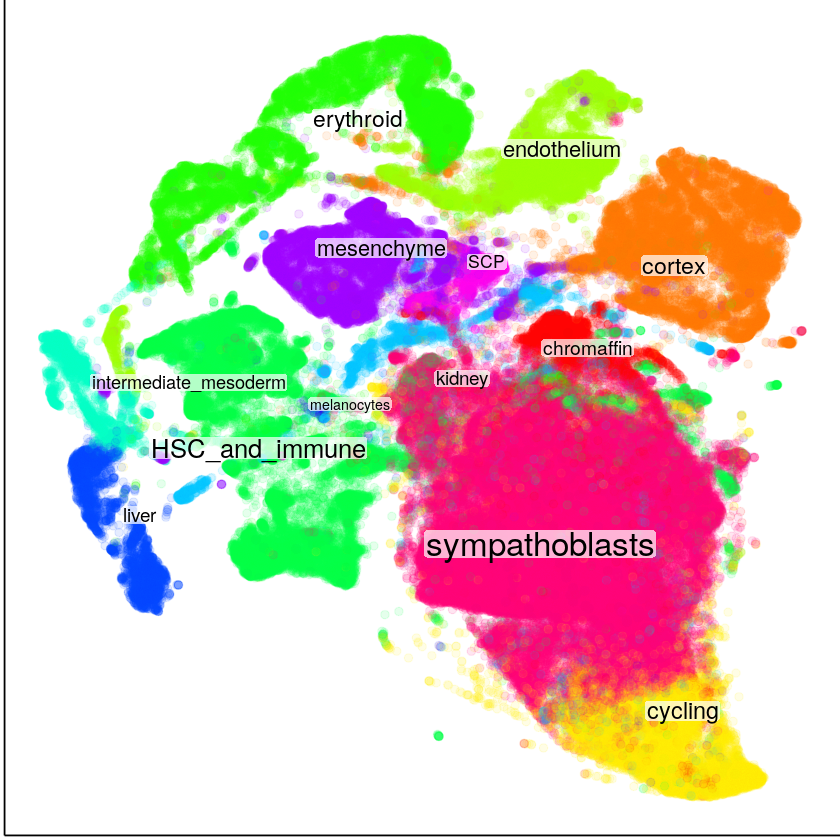

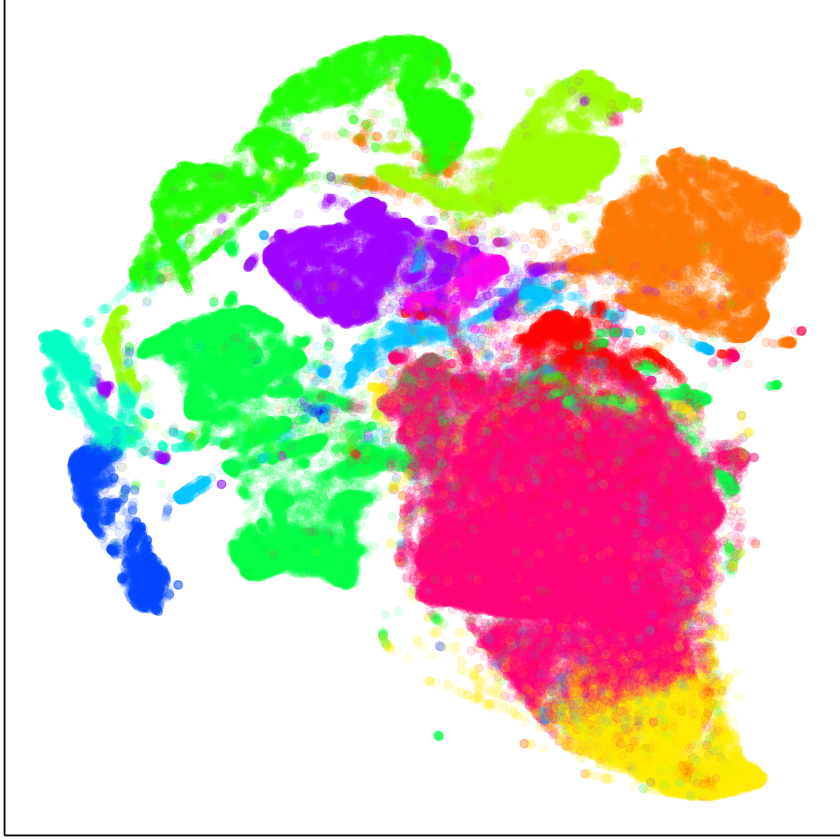

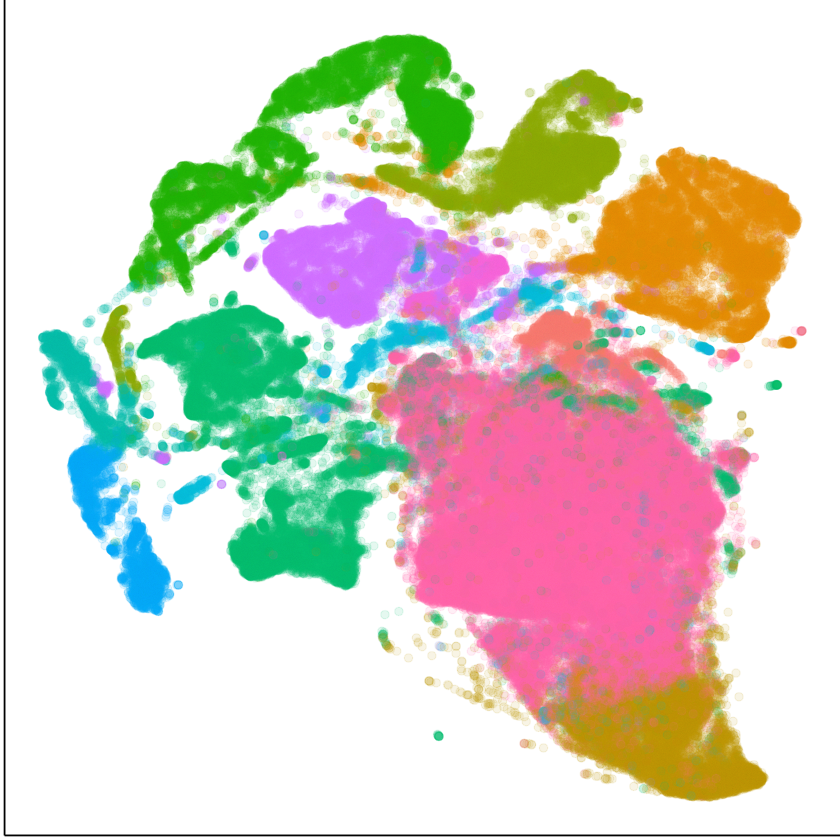

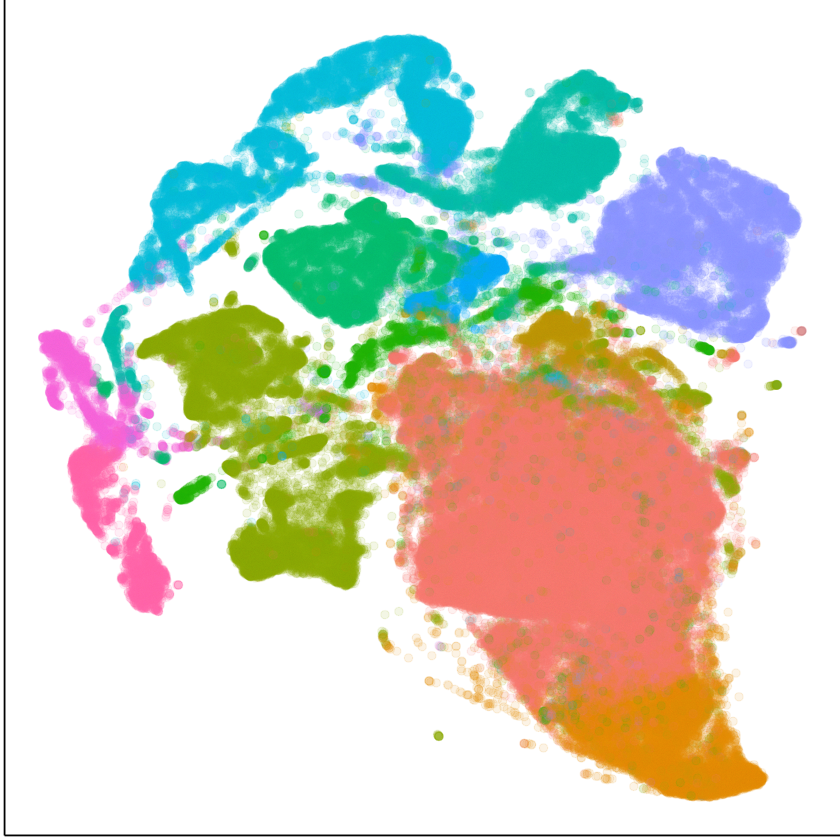

In [14]:
#export common embeddings

dir.create('figures/neuroblastoma_Dong/shared_graph_nogrid/')
library(ggplot2)
#con$plotGraph(mark.groups=T, alpha=0.1, size=2, show.legend=T, groups=annot, plot.na=T)
#con$plotGraph(mark.groups=T, alpha=0.1, size=2, show.legend=T, groups=fates_medulla, plot.na=T)

#con$plotGraph(mark.groups=T, alpha=0.1, size=2, show.legend=F, groups=annot, plot.na=F)
#ggsave('figures/neuroblastoma_Dong/shared_graph4/shared_graph.neuroblastoma_original.png', width=5, height=5, dpi = 320)
#con$plotGraph(mark.groups=F, alpha=0.1, size=2, show.legend=F, groups=annot, plot.na=F)
#ggsave('figures/neuroblastoma_Dong/shared_graph4/shared_graph.neuroblastoma_original.nomarks.png', width=5, height=5, dpi = 320)


require(scales)

fates = sort(unique(fates_medulla))
fate2col = hue_pal()(length(fates))
names(fate2col) = fates
#fates
fate2col2 = fate2col
names(fate2col2) = c(ord, setdiff(fates, ord))

fate2color = function(x){
    y = fate2col[x]
    names(y) = names(x)
    y
}
fate2color2 = function(x){
    y = fate2col2[x]
    names(y) = names(x)
    y
}

#con$plotGraph(mark.groups=T, alpha=0.1, size=2, show.legend=F, groups=fates_medulla[fates_medulla!='medulla'], plot.na=F)
con$plotGraph(mark.groups=T, alpha=0.1, size=2, show.legend=F, groups=fates_medulla, plot.na=F)+theme(panel.border = element_blank(), panel.grid.major = element_blank(), panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"))
ggsave('figures/neuroblastoma_Dong/shared_graph_nogrid/shared_graph.fates_annot.png', width=5, height=5, dpi = 320)
con$plotGraph(mark.groups=F, alpha=0.1, size=2, show.legend=F, groups=fates_medulla, plot.na=F)+theme(panel.border = element_blank(), panel.grid.major = element_blank(), panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"))
ggsave('figures/neuroblastoma_Dong/shared_graph_nogrid/shared_graph.fates_annot.colors_conos.png', width=5, height=5, dpi = 320)
con$plotGraph(mark.groups=F, alpha=0.1, size=2, show.legend=F, colors=fate2color(fates_medulla), plot.na=F)+theme(panel.border = element_blank(), panel.grid.major = element_blank(), panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"))
ggsave('figures/neuroblastoma_Dong/shared_graph_nogrid/shared_graph.fates_annot.nomarks.png', width=5, height=5, dpi = 320)
con$plotGraph(mark.groups=F, alpha=0.1, size=2, show.legend=F, colors=fate2color2(fates_medulla), plot.na=F)+theme(panel.border = element_blank(), panel.grid.major = element_blank(), panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"))
ggsave('figures/neuroblastoma_Dong/shared_graph_nogrid/shared_graph.fates_annot.nomarks.colors_barplot.png', width=5, height=5, dpi = 320)


#con$plotGraph(mark.groups=T, alpha=0.1, size=2, show.legend=F, groups=new.annot[new.annot!='medulla' & names(new.annot) %in% names(annot)], plot.na=F)
con$plotGraph(mark.groups=T, alpha=0.1, size=2, show.legend=F, 
              groups=new.annot[!(names(new.annot) %in% colnames(con$samples[[1]]))], plot.na=F)+theme(panel.border = element_blank(), panel.grid.major = element_blank(), panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"))
ggsave('figures/neuroblastoma_Dong/shared_graph_nogrid/shared_graph.neuroblastoma_transferred.png', width=5, height=5, dpi = 320)
con$plotGraph(mark.groups=F, alpha=0.1, size=2, show.legend=F, 
              groups=new.annot[!(names(new.annot) %in% colnames(con$samples[[1]]))], plot.na=F)+theme(panel.border = element_blank(), panel.grid.major = element_blank(), panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"))
ggsave('figures/neuroblastoma_Dong/shared_graph_nogrid/shared_graph.neuroblastoma_transferred.colors_conos.png', width=5, height=5, dpi = 320)
con$plotGraph(mark.groups=F, alpha=0.1, size=2, show.legend=F, colors=fate2color(new.annot[!(names(new.annot) %in% colnames(con$samples[[1]]))]), plot.na=F)+theme(panel.border = element_blank(), panel.grid.major = element_blank(), panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"))
ggsave('figures/neuroblastoma_Dong/shared_graph_nogrid/shared_graph.neuroblastoma_transferred.nomarks.png', width=5, height=5, dpi = 320)
con$plotGraph(mark.groups=F, alpha=0.1, size=2, show.legend=F, colors=fate2color2(new.annot[!(names(new.annot) %in% colnames(con$samples[[1]]))]), plot.na=F)+theme(panel.border = element_blank(), panel.grid.major = element_blank(), panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"))
ggsave('figures/neuroblastoma_Dong/shared_graph_nogrid/shared_graph.neuroblastoma_transferred.nomarks.colors_barplot.png', width=5, height=5, dpi = 320)


#con$plotGraph(mark.groups=T, alpha=0.1, size=2, show.legend=T, groups=fates_medulla, plot.na=T)
#con$plotGraph(mark.groups=T, alpha=0.1, size=2, show.legend=F, groups=annot, plot.na=F)
#con$plotGraph(mark.groups=T, alpha=0.1, size=2, show.legend=F, groups=fates_medulla, plot.na=F)

con$plotGraph(mark.groups=T, alpha=0.1, size=2, show.legend=F, groups=new.annot, plot.na=F)+theme(panel.border = element_blank(), panel.grid.major = element_blank(), panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"))
ggsave('figures/neuroblastoma_Dong/shared_graph_nogrid/shared_graph.combined_transferred.png', width=5, height=5, dpi = 320)
con$plotGraph(mark.groups=F, alpha=0.1, size=2, show.legend=F, groups=new.annot, plot.na=F)+theme(panel.border = element_blank(), panel.grid.major = element_blank(), panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"))
ggsave('figures/neuroblastoma_Dong/shared_graph_nogrid/shared_graph.combined_transferred.colors_conos.png', width=5, height=5, dpi = 320)
con$plotGraph(mark.groups=F, alpha=0.1, size=2, show.legend=F, colors=fate2color(new.annot), plot.na=F)+theme(panel.border = element_blank(), panel.grid.major = element_blank(), panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"))
ggsave('figures/neuroblastoma_Dong/shared_graph_nogrid/shared_graph.combined_transferred.nomarks.png', width=5, height=5, dpi = 320)
con$plotGraph(mark.groups=F, alpha=0.1, size=2, show.legend=F, colors=fate2color2(new.annot), plot.na=F)+theme(panel.border = element_blank(), panel.grid.major = element_blank(), panel.grid.minor = element_blank(), axis.line = element_line(colour = "black"))
ggsave('figures/neuroblastoma_Dong/shared_graph_nogrid/shared_graph.combined_transferred.nomarks.colors_barplot.png', width=5, height=5, dpi = 320)
